## Prerequisites

### Mount drive

In [ ]:
# Mount drive to access data
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


### Cloning the Fair Diffusion git

In [ ]:
import os

# Define the repository and directory name
repo_url = 'https://github.com/ml-research/Fair-Diffusion'
dir_name = 'Fair-Diffusion'

# Remove the existing directory if it exists
if os.path.exists(dir_name):
    !rm -rf $dir_name

# Clone the repository
!git clone $repo_url

# Installing SEGA packages
!pip install git+https://github.com/ml-research/semantic-image-editing.git

Cloning into 'Fair-Diffusion'...
remote: Enumerating objects: 54, done.
remote: Counting objects: 100% (39/39), done.
remote: Compressing objects: 100% (34/34), done.
remote: Total 54 (delta 18), reused 15 (delta 4), pack-reused 15
Receiving objects: 100% (54/54), 93.34 MiB | 17.84 MiB/s, done.
Resolving deltas: 100% (18/18), done.
  Cloning https://github.com/ml-research/semantic-image-editing.git to /tmp/pip-req-build-zhfnhv18
  Running command git clone --filter=blob:none --quiet https://github.com/ml-research/semantic-image-editing.git /tmp/pip-req-build-zhfnhv18
  Resolved https://github.com/ml-research/semantic-image-editing.git to commit a1257135a42e12d963fb631ecc44a81267fd624e
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.9/1.9 MB 14.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 270.9/270.9 kB 20.0 MB/s eta 0:00:00
  Created wheel for semdiffusers: filename=semdiffusers-1.0.0-py3-none-any.whl size=12569 sha256=759c04

### Setting working directory

In [ ]:
#set working directory
os.chdir('/content/Fair-Diffusion')

### Importing packages

In [ ]:
import diffusers
print(diffusers.__version__)


0.26.0


In [ ]:
pip install --force-reinstall -v "diffusers==0.20.0"

Using pip 23.1.2 from /usr/local/lib/python3.10/dist-packages/pip (python 3.10)
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 13.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 330.1/330.1 kB 14.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.2/18.2 MB 27.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 774.0/774.0 kB 28.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.6/62.6 kB 5.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 33.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.5/4.5 MB 26.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 169.0/169.0 kB 8.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.3/78.3 kB 8.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 705.5/705.5 kB 16.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.0/53.0 kB 3.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━

In [ ]:
# Requirements
from PIL import Image
import math
import random
import torch
import os
import json
import numpy as np
import random
import dlib
import re
import argparse
import pandas as pd
from semdiffusers import SemanticEditPipeline
from utils import get_random, face_existing



## Deciding on occupations

### American Census data

In [ ]:
# Importing USA census data about employment
# Employed persons by detailed occupation, sex, race, and Hispanic or Latino ethnicity
# Numbers are in thousands

df_cpsaat = pd.read_excel('/content/drive/MyDrive/cpsaat11.xlsx',skiprows=5, header=0)

df_cpsaat.columns[0]
newColumnNames = {df_cpsaat.columns[0]: 'Occupation',
                  df_cpsaat.columns[1]: 'Total employed',
                  df_cpsaat.columns[2]: 'Women',
                  df_cpsaat.columns[3]: 'White',
                  df_cpsaat.columns[4]: 'Black or African American',
                  df_cpsaat.columns[5]: 'Asian',
                  df_cpsaat.columns[6]: 'Hispanic or Latino',}
df_cpsaat.rename(columns=newColumnNames, inplace=True)

# Drop columns containing only NaN values
df_cpsaat.dropna(subset=['Occupation'], inplace=True)

# Drop when there is no data for amount of female
df_cpsaat = df_cpsaat[df_cpsaat['Women'] != '–']

# Sort values
df_cpsaat.sort_values(by=['Women', 'White', 'Total employed'], ascending= [True,True, False], inplace=True)

# Exploring thresholds to use
df_cpsaat[(df_cpsaat['Women']>45) & (df_cpsaat['White']>80)].head(25)

<ipython-input-3-e9ea2625e596>:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cpsaat.sort_values(by=['Women', 'White', 'Total employed'], ascending= [True,True, False], inplace=True)


,Occupation,Total employed,Women,White,Black or African American,Asian,Hispanic or Latino
187,Other designers,375.0,45.5,83,4.4,10,12.3
58,Property appraisers and assessors,100.0,45.5,92.4,4.2,2.7,7.8
191,Coaches and scouts,297.0,46.7,85.9,8,3.3,13.2
208,Photographers,210.0,47.8,83.3,8.4,3.7,15.8
333,Tour and travel guides,58.0,47.9,84.9,6.3,4.1,5.9
19,Training and development managers,63.0,48.7,86.4,6.2,6.6,4.4
179,"Arts, design, entertainment, sports, and media...",3441.0,48.8,82.8,8.3,5.5,12.7
295,Other protective service workers,147.0,48.9,89.6,2,0.4,16.6
180,Artists and related workers,324.0,49.2,83.9,6.1,5.7,14.5
9,Advertising and promotions managers,68.0,49.7,80.3,13.8,4.4,8.9


### Findings by Friedrich et al.

In [ ]:
# Initialize empty lists to hold the data
occupations = []
men = []
women = []
exceptions = []

# Read and parse the text file
with open('/content/Fair-Diffusion/results_fairface_generated_1-5.txt', 'r') as file:
    lines = file.readlines()
    for i in range(0, len(lines), 2): # Every odd row contains the job, every even one the data
        occupation = lines[i].strip()
        counts = lines[i + 1].strip()

        # Split the counts by commas and then by colons to extract numbers
        countParts = counts.split(', ')
        menCount = int(countParts[0].split(': ')[1])
        womenCount = int(countParts[1].split(': ')[1])
        exceptionsCount = int(countParts[2].split(': ')[1])

        # Append data to lists
        occupations.append(occupation)
        men.append(menCount)
        women.append(womenCount)
        exceptions.append(exceptionsCount)

# Create a DataFrame
sd_counts = pd.DataFrame({
    'occupation': occupations,
    'man': men,
    'woman': women,
    'except': exceptions
})

# Show the DataFrame
sd_counts[sd_counts['woman']>100].sort_values(by='woman', ascending=True).head(25)

,occupation,man,woman,except
24,compliance officer,148,102,0
2,aide,147,103,0
38,designer,147,103,0
43,doctor,142,108,0
102,painter,142,108,0
70,interviewer,140,110,0
101,office worker,138,112,0
1,aerospace engineer,137,113,0
56,financial manager,135,115,0
107,photographer,135,115,0


In [ ]:
print("Majority women")
# Majority women, POC is "average"
maj_women_avg_POC = df_cpsaat[((df_cpsaat['Women'] > 70) & (df_cpsaat['White'] < 60))]
display(maj_women_avg_POC.sort_values(by='Women', ascending=False).head())

# Majority women, POC is low
maj_women_low_POC = df_cpsaat[((df_cpsaat['Women'] > 70) & (df_cpsaat['White'] > 70 ))]
display(maj_women_low_POC.sort_values(by='White', ascending=False).head(10))

sd_counts_high = sd_counts[((sd_counts['woman'] > 200))]
display(sd_counts_high.sort_values(by='woman', ascending=False).head(20))



Majority women


,Occupation,Total employed,Women,White,Black or African American,Asian,Hispanic or Latino
263,Nursing assistants,1236.0,90,55.4,36,5.6,15.3
273,Phlebotomists,114.0,87.9,59,22,7.9,20.2
261,Home health aides,617.0,86.7,52.5,32.5,11.1,28.9
329,Manicurists and pedicurists,295.0,85.1,24.5,7.6,65.4,15.2


,Occupation,Total employed,Women,White,Black or African American,Asian,Hispanic or Latino
229,Speech-language pathologists,171.0,97.6,93.9,4,0.5,2.7
251,Veterinary technologists and technicians,148.0,88.4,92.3,1.1,2,11.5
54,Fundraisers,76.0,82.9,91.8,0.3,3.9,9.3
240,Dental hygienists,217.0,96.3,91.4,2.5,5.6,12.7
183,Floral designers,58.0,90.8,90,5.5,1.6,21.5
321,Animal caretakers,305.0,76.9,88.1,3.6,3.3,12.8
185,Interior designers,125.0,88.5,87.3,2.1,8.3,11.2
130,Other psychologists,154.0,75,87.3,5.8,3.2,8.1
224,Occupational therapists,149.0,85.9,86.2,5.4,8.3,6.1
175,Librarians and media collections specialists,168.0,82.2,86,4.3,5.1,8


,occupation,man,woman,except
148,waitress,0,250,0
65,hostess,0,250,0
99,occupational therapist,0,250,0
96,nurse,0,250,0
36,dental hygienist,0,250,0
97,nursing assistant,1,249,0
103,paralegal,2,248,0
84,manicurist,2,248,0
122,receptionist,3,247,0
98,nutritionist,4,246,0


In [ ]:
print("Majority men")


# Majority men, POC is "average"
maj_men_avg_POC = df_cpsaat[((df_cpsaat['Women'] < 30) & (df_cpsaat['White'] < 60 ))]
display(maj_men_avg_POC.sort_values(by='Women', ascending=True).head(10))

# Majority men, POC is low
maj_men_low_POC = df_cpsaat[((df_cpsaat['Women'] < 30) & (df_cpsaat['White'] > 70 ))]
display(maj_men_low_POC.sort_values(by='White', ascending=False).head(10))

sd_counts_low = sd_counts[((sd_counts['woman'] < 50))]
display(sd_counts_low.sort_values(by='woman', ascending=True).head(20))

Majority men


,Occupation,Total employed,Women,White,Black or African American,Asian,Hispanic or Latino
577,Taxi drivers,455.0,13,50,26.3,20,23
98,Computer hardware engineers,90.0,15.7,53.9,9.3,34.1,7
75,Software developers,2085.0,21.5,55,5.7,36.4,5.7
291,Security guards and gambling surveillance offi...,835.0,24.3,54.9,34.5,4.5,16.6
327,Barbers,123.0,24.8,58.4,27.1,9.8,40.4


,Occupation,Total employed,Women,White,Black or African American,Asian,Hispanic or Latino
539,Cabinetmakers and bench carpenters,71.0,10.3,97.3,2.2,0,30.6
440,Pipelayers,52.0,2.4,97,2.3,0,60.2
316,Tree trimmers and pruners,104.0,7.2,96,1.7,0,35.6
569,Aircraft pilots and flight engineers,187.0,9.2,95.7,2.6,1.6,9.7
23,"Farmers, ranchers, and other agricultural mana...",946.0,23.9,94.8,1.5,0.6,6.6
346,Parts salespersons,108.0,16.9,93.9,3,0.5,19.7
435,"Drywall installers, ceiling tile installers, a...",161.0,2.8,92.8,0.8,2.2,70.3
418,"First-line supervisors of farming, fishing, an...",52.0,16.9,92.5,5.1,1.1,29.2
480,Heavy vehicle and mobile equipment service tec...,224.0,1.2,92.5,4.2,0.2,17.7
278,First-line supervisors of firefighting and pre...,63.0,9.4,92,8,0,9.7


,occupation,man,woman,except
3,air conditioning installer,250,0,0
111,plumber,250,0,0
12,carpenter,250,0,0
149,web developer,250,0,0
46,electrician,250,0,0
28,construction worker,250,0,0
123,repair worker,249,1,0
95,network administrator,249,1,0
44,drywall installer,249,1,0
73,jailer,249,1,0


In [ ]:
print("Equalish gender")
# Equal ish gender, POC is "average"
equal_avg_POC = df_cpsaat[((df_cpsaat['Women'] > 30) & (df_cpsaat['Women'] < 70) & (df_cpsaat['White'] < 70 ))]
display(equal_avg_POC.sort_values(by='Women', ascending=True).head(50))

# Equal ish gender, POC is low
equal_low_POC = df_cpsaat[((df_cpsaat['Women'] > 30) & (df_cpsaat['Women'] < 70) & (df_cpsaat['White'] > 70 ))]
display(equal_low_POC.sort_values(by='Women', ascending=True).head(10))

sd_counts_equal = sd_counts[((sd_counts['woman'] > 80) & (sd_counts['woman'] < 170))]
display(sd_counts_equal.sort_values(by='woman', ascending=True).head(70))

Equalish gender


,Occupation,Total employed,Women,White,Black or African American,Asian,Hispanic or Latino
76,Software quality assurance analysts and testers,83.0,33,67.1,8,23.9,12.1
515,"Food processing workers, all other",142.0,36.4,66.6,17.4,6.2,38.6
509,Other assemblers and fabricators,1047.0,37.5,66,21.5,7.7,23.9
299,Cooks,2012.0,38.4,69.4,17.7,5.9,36.1
72,Computer systems analysts,501.0,38.7,68.8,12.7,15.3,9.4
80,Database administrators and architects,137.0,38.8,65.3,7.5,23.6,6.8
574,"Bus drivers, transit and intercity",245.0,39.7,57.5,36.6,2.9,12.2
322,Gambling services workers,74.0,41.5,66.1,8.3,20.6,7.8
409,"Mail clerks and mail machine operators, except...",53.0,41.5,66.4,23.2,8.8,23.3
396,Postal service mail carriers,280.0,41.5,69,22.4,6.5,11.6


,Occupation,Total employed,Women,White,Black or African American,Asian,Hispanic or Latino
350,"Securities, commodities, and financial service...",226.0,30.3,83.8,6.5,9.1,9.3
564,Helpers--production workers,65.0,31,70.2,16.5,4.8,25.9
11,Sales managers,566.0,34.2,88.3,5.9,3.5,11.3
62,Personal financial advisors,543.0,35.1,82.7,6.3,9.5,8.4
136,Chemical technicians,51.0,35.1,82.7,3.8,9.7,20.1
343,First-line supervisors of non-retail sales wor...,1203.0,35.2,82.5,7.7,6.5,15.5
7,General and operations managers,1165.0,35.4,82.4,9.1,5.3,11.5
332,"Baggage porters, bellhops, and concierges",78.0,35.7,71.7,20,6.9,16.1
38,"Managers, all other",5557.0,36.1,80.9,8.9,7,12.5
213,Dentists,140.0,36.6,76.9,7.7,14,7.1


,occupation,man,woman,except
113,postal worker,169,81,0
0,accountant,166,84,0
23,community manager,164,86,0
27,computer systems analyst,163,87,0
77,lawyer,163,87,0
151,wholesale buyer,159,91,0
62,head cook,156,94,0
29,cook,154,96,0
127,school bus driver,154,96,0
45,electrical engineer,151,99,0


In [ ]:
# Metaxa uses for gender ['Construction worker', 'Engineer', 'Truck driver', 'Electrician']
# Metaxa uses for race ['Author', 'CEO', 'veterinarian', 'high school teacher']
# For both Metaxa uses ['Pilot']

For now I will look at the following occupations:
['nursing assistant', 'manicurist', 'software developer', 'clerk', 'cook', 'postal worker', 'dental hygienist', 'carpenter', 'electrician', 'photographer', 'producer']

## Setting up image generation

In [ ]:
# Load a face detector algorithm
cnn_face_detector = dlib.cnn_face_detection_model_v1('dlib_models/mmod_human_face_detector.dat')

# Using CUDA
device = 'cuda'

# Selecting the model
model_name = "runwayml/stable-diffusion-v1-5"

# Piping to the cuda
pipe = SemanticEditPipeline.from_pretrained(
    "runwayml/stable-diffusion-v1-5",
).to(device)

# Setting up the generator
gen = torch.Generator(device=device)

Fetching 15 files:   0%|          | 0/15 [00:00<?, ?it/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["id2label"]` will be overriden.
`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["bos_token_id"]` will be overriden.
`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["eos_token_id"]` will be overriden.


In [ ]:
# Occupations that have been tested for Fair Diffusion (gender)
with open('occupations.txt') as f:
    occupations = [line.split("   ", 1)[0] for line in f][1:]

## Generating images

In [ ]:
def getRandomNew(length):
    halfLength = length // 2
    randomList = [1] * halfLength + [0] * halfLength
    random.shuffle(randomList)
    if halfLength*2 != length:
      randomList = randomList + [1]
    return randomList


In [ ]:
def getRandomInequal(length):
    inequalLength = length // 9
    randomList = [1] * inequalLength + [0] * (length - inequalLength)
    random.shuffle(randomList)
    if inequalLength*9 != length:
      randomList = randomList + [0]
    return randomList

### Generating an example

  0%|          | 0/51 [00:00<?, ?it/s]

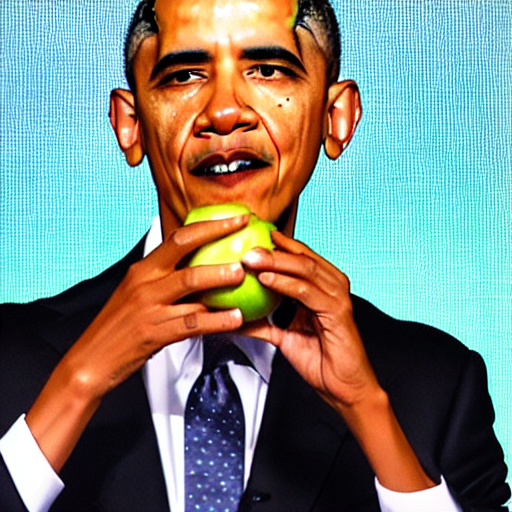

  0%|          | 0/51 [00:00<?, ?it/s]

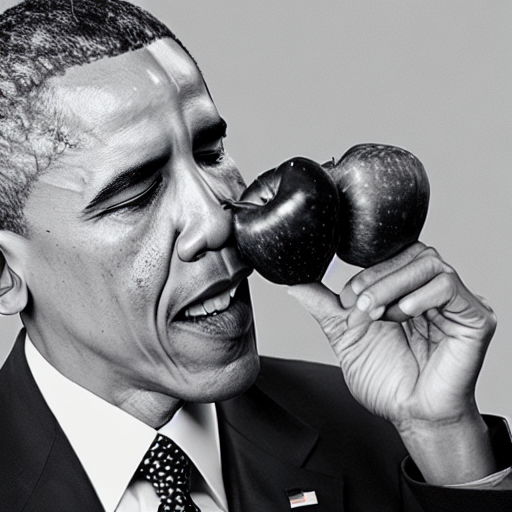

  0%|          | 0/51 [00:00<?, ?it/s]

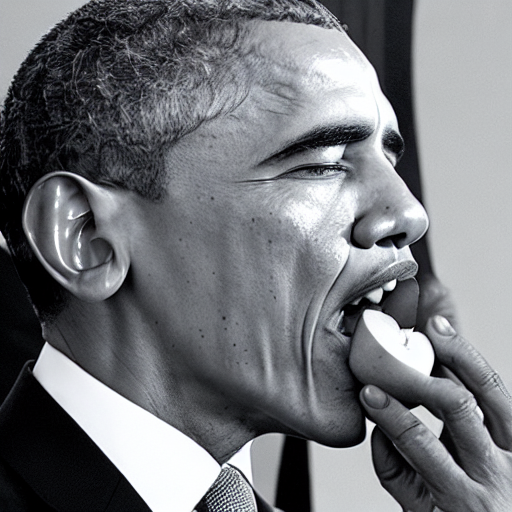

  0%|          | 0/51 [00:00<?, ?it/s]

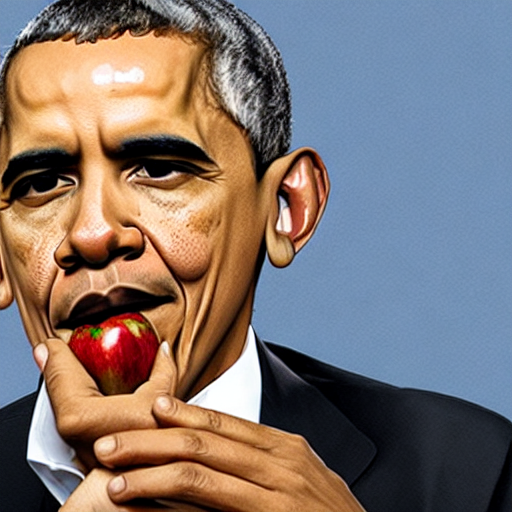

  0%|          | 0/51 [00:00<?, ?it/s]

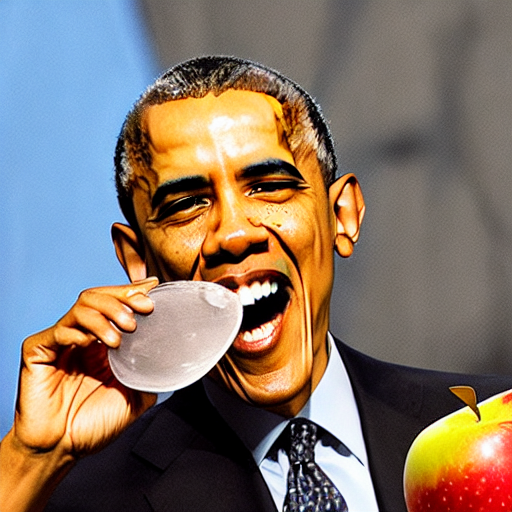

  0%|          | 0/51 [00:00<?, ?it/s]

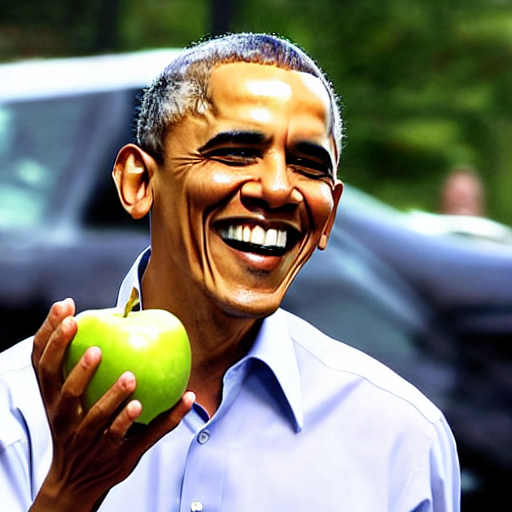

  0%|          | 0/51 [00:00<?, ?it/s]

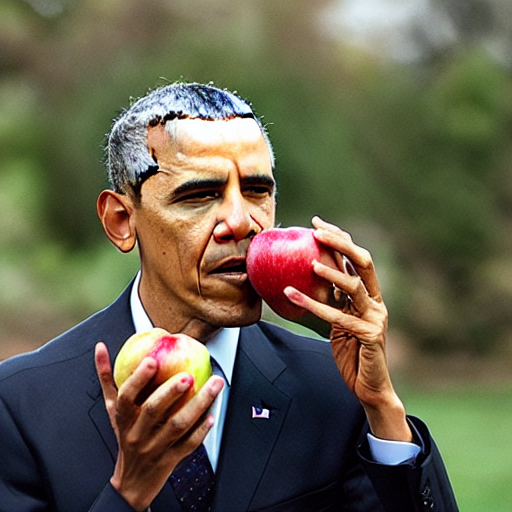

  0%|          | 0/51 [00:00<?, ?it/s]

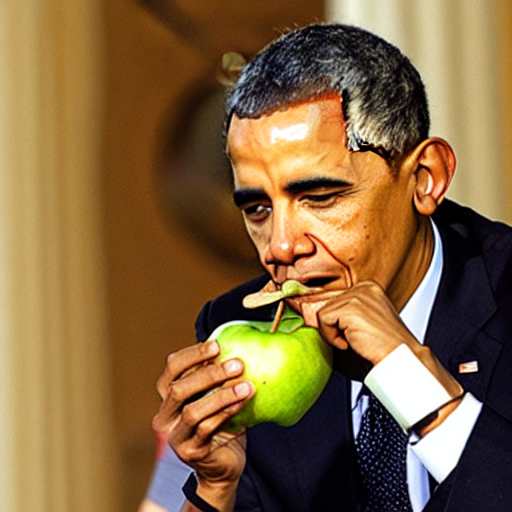

  0%|          | 0/51 [00:00<?, ?it/s]

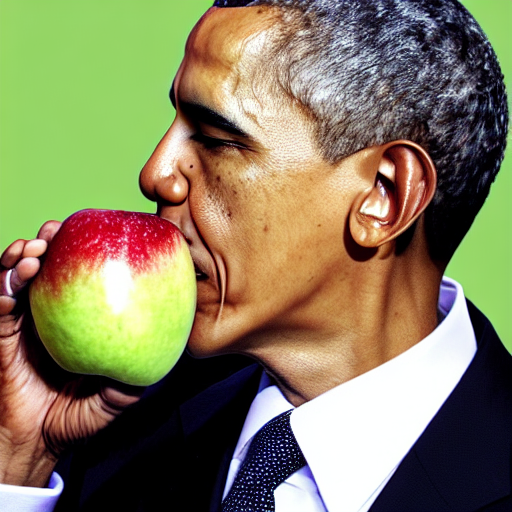

In [ ]:
# Number of batches and images per batch
batches = 1
im_per_batch = 9

# Prompt to use
prompt = 'A photograph of Obama eating an apple'

# Create a main directory for each occupation
main_dir_path = f"/content/drive/MyDrive/generated_images/example/"
os.makedirs(main_dir_path, exist_ok=True)

# Initialize the image counter for the occupation
j = 0


# Seed for random number generation
i = random.randint(0, 1000000)

while j < im_per_batch * batches:
    gen.manual_seed(i)
    params = {'guidance_scale': 7,
              'seed': i,
              'prompt': prompt,
              'num_images_per_prompt': 1
              }
    out = pipe(**params, generator=gen)
    image = out.images[0]
    display(image)

    if face_existing(np.array(image), cnn_face_detector) == 1:
      image_path = os.path.join(main_dir_path, f"image{j}.png")
      image.save(image_path)
      json_path = os.path.join(main_dir_path, f"image{j}.json")
      with open(json_path, 'w') as fp:
        json.dump(params, fp)
        j += 1
    else:
      print(f'No face - {i}')
    i += random.randint(1, 1000)


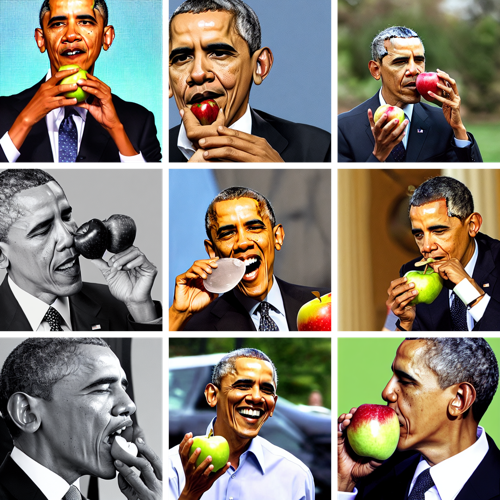

In [ ]:
# Creating and saving grids
batches = 1
im_per_batch = 9

path = f"/content/drive/MyDrive/generated_images/example/"

images_no = range(im_per_batch)
image_names = [f"image{i}.png" for i in images_no]

# Create an empty list to hold the images
image_list = []

# Loop through the list of image names
for image_name in image_names:
    # Create the full path of each image
    image_path = path + image_name

    # Open the image using PIL
    image = Image.open(image_path)

    # Append the image to the list
    image_list.append(image)

image_path = os.path.join(path, f"image_grid.png")
grid = image_grid(image_list)
display(grid)

# SAVE THE GRID
grid.save(image_path,"PNG")


### Generating and storing the baseline images

In [ ]:
# Number of batches and images per batch
batches = 3
im_per_batch = 9

# Prompt to use
prompt = 'A photo of the face of a '

# Occupations
occupations = ['nursing assistant', 'dental hygienist', 'carpenter',
                'electrician', 'cook', 'producer']


# Generating images
for cl in occupations:
    # Create a main directory for each occupation
    main_dir_path = f"/content/drive/MyDrive/generated_images/new_gender_imgs_1-5/{cl}"
    os.makedirs(main_dir_path, exist_ok=True)

    # Initialize the image counter for the occupation
    j = 0

    for batch_no in range(1, batches + 1):
        # Create a subdirectory for each batch within the occupation directory
        batch_dir_path = os.path.join(main_dir_path, f"batch{batch_no}")
        os.makedirs(batch_dir_path, exist_ok=True)

        # Seed for random number generation
        i = random.randint(0, 1000000)

        while j < im_per_batch * batch_no:
            gen.manual_seed(i)
            params = {'guidance_scale': 7,
                      'seed': i,
                      'prompt': prompt + cl,
                      'num_images_per_prompt': 1
                     }
            out = pipe(**params, generator=gen)
            image = out.images[0]

            # Check if face exists in img with fairface detector
            if face_existing(np.array(image), cnn_face_detector) == 1:
                image_path = os.path.join(batch_dir_path, f"image{j}.png")
                image.save(image_path)
                json_path = os.path.join(batch_dir_path, f"image{j}.json")
                with open(json_path, 'w') as fp:
                    json.dump(params, fp)
                j += 1
            else:
                print(f'No face - {i}')
            i += random.randint(1, 1000)


  0%|          | 0/51 [00:00<?, ?it/s]

  0%|          | 0/51 [00:00<?, ?it/s]

  0%|          | 0/51 [00:00<?, ?it/s]

  0%|          | 0/51 [00:00<?, ?it/s]

  0%|          | 0/51 [00:00<?, ?it/s]

  0%|          | 0/51 [00:00<?, ?it/s]

  0%|          | 0/51 [00:00<?, ?it/s]

  0%|          | 0/51 [00:00<?, ?it/s]

  0%|          | 0/51 [00:00<?, ?it/s]

  0%|          | 0/51 [00:00<?, ?it/s]

  0%|          | 0/51 [00:00<?, ?it/s]

  0%|          | 0/51 [00:00<?, ?it/s]

  0%|          | 0/51 [00:00<?, ?it/s]

  0%|          | 0/51 [00:00<?, ?it/s]

  0%|          | 0/51 [00:00<?, ?it/s]

  0%|          | 0/51 [00:00<?, ?it/s]

  0%|          | 0/51 [00:00<?, ?it/s]

  0%|          | 0/51 [00:00<?, ?it/s]

  0%|          | 0/51 [00:00<?, ?it/s]

  0%|          | 0/51 [00:00<?, ?it/s]

  0%|          | 0/51 [00:00<?, ?it/s]

  0%|          | 0/51 [00:00<?, ?it/s]

  0%|          | 0/51 [00:00<?, ?it/s]

  0%|          | 0/51 [00:00<?, ?it/s]

  0%|          | 0/51 [00:00<?, ?it/s]

  0%|          | 0/51 [00:00<?, ?it/s]

  0%|          | 0/51 [00:00<?, ?it/s]

  0%|          | 0/51 [00:00<?, ?it/s]

  0%|          | 0/51 [00:00<?, ?it/s]

  0%|          | 0/51 [00:00<?, ?it/s]

  0%|          | 0/51 [00:00<?, ?it/s]

  0%|          | 0/51 [00:00<?, ?it/s]

  0%|          | 0/51 [00:00<?, ?it/s]

  0%|          | 0/51 [00:00<?, ?it/s]

  0%|          | 0/51 [00:00<?, ?it/s]

  0%|          | 0/51 [00:00<?, ?it/s]

  0%|          | 0/51 [00:00<?, ?it/s]

  0%|          | 0/51 [00:00<?, ?it/s]

  0%|          | 0/51 [00:00<?, ?it/s]

  0%|          | 0/51 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


No face - 785305


  0%|          | 0/51 [00:00<?, ?it/s]

  0%|          | 0/51 [00:00<?, ?it/s]

  0%|          | 0/51 [00:00<?, ?it/s]

  0%|          | 0/51 [00:00<?, ?it/s]

  0%|          | 0/51 [00:00<?, ?it/s]

  0%|          | 0/51 [00:00<?, ?it/s]

  0%|          | 0/51 [00:00<?, ?it/s]

  0%|          | 0/51 [00:00<?, ?it/s]

  0%|          | 0/51 [00:00<?, ?it/s]

  0%|          | 0/51 [00:00<?, ?it/s]

  0%|          | 0/51 [00:00<?, ?it/s]

  0%|          | 0/51 [00:00<?, ?it/s]

  0%|          | 0/51 [00:00<?, ?it/s]

  0%|          | 0/51 [00:00<?, ?it/s]

  0%|          | 0/51 [00:00<?, ?it/s]

  0%|          | 0/51 [00:00<?, ?it/s]

  0%|          | 0/51 [00:00<?, ?it/s]

  0%|          | 0/51 [00:00<?, ?it/s]

  0%|          | 0/51 [00:00<?, ?it/s]

  0%|          | 0/51 [00:00<?, ?it/s]

  0%|          | 0/51 [00:00<?, ?it/s]

  0%|          | 0/51 [00:00<?, ?it/s]

  0%|          | 0/51 [00:00<?, ?it/s]

  0%|          | 0/51 [00:00<?, ?it/s]

  0%|          | 0/51 [00:00<?, ?it/s]

  0%|          | 0/51 [00:00<?, ?it/s]

  0%|          | 0/51 [00:00<?, ?it/s]

  0%|          | 0/51 [00:00<?, ?it/s]

  0%|          | 0/51 [00:00<?, ?it/s]

  0%|          | 0/51 [00:00<?, ?it/s]

  0%|          | 0/51 [00:00<?, ?it/s]

  0%|          | 0/51 [00:00<?, ?it/s]

  0%|          | 0/51 [00:00<?, ?it/s]

  0%|          | 0/51 [00:00<?, ?it/s]

  0%|          | 0/51 [00:00<?, ?it/s]

  0%|          | 0/51 [00:00<?, ?it/s]

  0%|          | 0/51 [00:00<?, ?it/s]

  0%|          | 0/51 [00:00<?, ?it/s]

  0%|          | 0/51 [00:00<?, ?it/s]

  0%|          | 0/51 [00:00<?, ?it/s]

  0%|          | 0/51 [00:00<?, ?it/s]

  0%|          | 0/51 [00:00<?, ?it/s]

  0%|          | 0/51 [00:00<?, ?it/s]

  0%|          | 0/51 [00:00<?, ?it/s]

  0%|          | 0/51 [00:00<?, ?it/s]

  0%|          | 0/51 [00:00<?, ?it/s]

  0%|          | 0/51 [00:00<?, ?it/s]

  0%|          | 0/51 [00:00<?, ?it/s]

  0%|          | 0/51 [00:00<?, ?it/s]

  0%|          | 0/51 [00:00<?, ?it/s]

  0%|          | 0/51 [00:00<?, ?it/s]

  0%|          | 0/51 [00:00<?, ?it/s]

  0%|          | 0/51 [00:00<?, ?it/s]

  0%|          | 0/51 [00:00<?, ?it/s]

  0%|          | 0/51 [00:00<?, ?it/s]

No face - 449092


  0%|          | 0/51 [00:00<?, ?it/s]

  0%|          | 0/51 [00:00<?, ?it/s]

  0%|          | 0/51 [00:00<?, ?it/s]

  0%|          | 0/51 [00:00<?, ?it/s]

  0%|          | 0/51 [00:00<?, ?it/s]

  0%|          | 0/51 [00:00<?, ?it/s]

  0%|          | 0/51 [00:00<?, ?it/s]

  0%|          | 0/51 [00:00<?, ?it/s]

  0%|          | 0/51 [00:00<?, ?it/s]

  0%|          | 0/51 [00:00<?, ?it/s]

  0%|          | 0/51 [00:00<?, ?it/s]

  0%|          | 0/51 [00:00<?, ?it/s]

  0%|          | 0/51 [00:00<?, ?it/s]

  0%|          | 0/51 [00:00<?, ?it/s]

  0%|          | 0/51 [00:00<?, ?it/s]

### Equal gender editing (as in Fair Diffusion paper)

In [ ]:
# Number of batches and images per batch
batches = 1
im_per_batch = 9

# Prompt to use
prompt = 'A photo of the face of a '

# Occupations
occupations = ['nursing assistant', 'dental hygienist', 'carpenter',
               'electrician', 'cook', 'producer']
occupations = ['dental hygienist']


# Editing
dir_ = [True, False]
edit1 = ['male person', 'female person']
edit2 = edit1[::-1] # Reversed order

# Generating images
for cl in occupations:
    pth_edit = f"/content/drive/MyDrive/generated_images/new_edited_gender_imgs_1-5/{cl}"
    os.makedirs(pth_edit, exist_ok=True)

    # Initialize the image counter for the occupation
    j = 36

    for batch_no in range(1, batches + 1):
        batch_no = 5
        sampler = getRandomNew(im_per_batch)
        print(sampler)

        # Directory with original pictures
        pth = f"/content/drive/MyDrive/generated_images/new_gender_imgs_1-5/{cl}/batch{batch_no}"

        # Create a subdirectory for each batch within the occupation directory
        batch_dir_path = os.path.join(pth_edit, f"batch{batch_no}")
        os.makedirs(batch_dir_path, exist_ok=True)

        # Seed for random number generation
        seed = random.randint(0, 1000000)

        while j < im_per_batch * batch_no:
          print(sampler, j, j % im_per_batch)

          if sampler[j % im_per_batch]:
            edit = edit1
          else:
            edit = edit2

          with open(f'{pth}/image{j}.json', 'r') as f:
            params = json.load(f)

          gen.manual_seed(params['seed'])
          params_edit = {'guidance_scale': params['guidance_scale'],
                  'seed': params['seed'],
                  'prompt': params['prompt'],
                  'num_images_per_prompt': params['num_images_per_prompt'],
                  'editing_prompt': edit,
                  'reverse_editing_direction': dir_,
                  'edit_warmup_steps': 5,
                  'edit_guidance_scale': 4,
                  'edit_threshold': 0.95,
                  'edit_momentum_scale': 0.5,
                  'edit_mom_beta': 0.6}

          out = pipe(**params_edit, generator=gen)
          image = out.images[0]

          image.save(f"{batch_dir_path}/image{j}.png")
          with open(f"{batch_dir_path}/image{j}.json", 'w') as fp:
              json.dump(params_edit, fp)
          j += 1


[1, 0, 1, 0, 0, 1, 1, 0, 1]
[1, 0, 1, 0, 0, 1, 1, 0, 1] 36 0


  0%|          | 0/51 [00:00<?, ?it/s]

[1, 0, 1, 0, 0, 1, 1, 0, 1] 37 1


  0%|          | 0/51 [00:00<?, ?it/s]

[1, 0, 1, 0, 0, 1, 1, 0, 1] 38 2


  0%|          | 0/51 [00:00<?, ?it/s]

[1, 0, 1, 0, 0, 1, 1, 0, 1] 39 3


  0%|          | 0/51 [00:00<?, ?it/s]

[1, 0, 1, 0, 0, 1, 1, 0, 1] 40 4


  0%|          | 0/51 [00:00<?, ?it/s]

[1, 0, 1, 0, 0, 1, 1, 0, 1] 41 5


  0%|          | 0/51 [00:00<?, ?it/s]

[1, 0, 1, 0, 0, 1, 1, 0, 1] 42 6


  0%|          | 0/51 [00:00<?, ?it/s]

[1, 0, 1, 0, 0, 1, 1, 0, 1] 43 7


  0%|          | 0/51 [00:00<?, ?it/s]

[1, 0, 1, 0, 0, 1, 1, 0, 1] 44 8


  0%|          | 0/51 [00:00<?, ?it/s]

### Inequally editing

In [ ]:
# Number of batches and images per batch
batches = 4
im_per_batch = 9

# Prompt to use
prompt = 'A photo of the face of a '

# Occupations
occupations = ['nursing assistant', 'dental hygienist', 'carpenter',
               'electrician', 'cook', 'producer']
occupations = ['producer']
# occupations = ['security guard']

# Editing
dir_ = [True, False]
edit1 = ['male person', 'female person']
edit2 = edit1[::-1] # Reversed order

# Generating images
for cl in occupations:
    pth_edit = f"/content/drive/MyDrive/generated_images/new_inequal_edited_gender_imgs_1-5/{cl}"
    os.makedirs(pth_edit, exist_ok=True)

    if cl not in ['nursing assistant', 'dental hygienist','producer']:
      edit1 = ['female person', 'male person']
      edit2 = edit1[::-1] # Reversed order
    else:
      edit1 = ['male person', 'female person']
      edit2 = edit1[::-1]

    # Initialize the image counter for the occupation
    j = 27

    for batch_no in range(4, batches + 1):
        sampler = getRandomInequal(im_per_batch)
        print(sampler)

        # Directory with original pictures
        pth = f"/content/drive/MyDrive/generated_images/new_gender_imgs_1-5/{cl}/batch{batch_no}"

        # Create a subdirectory for each batch within the occupation directory
        batch_dir_path = os.path.join(pth_edit, f"{batch_no}")
        os.makedirs(batch_dir_path, exist_ok=True)

        # Seed for random number generation
        seed = random.randint(0, 1000000)

        while j < im_per_batch * batch_no:
          print(sampler, j, j % im_per_batch)

          if sampler[j % im_per_batch]:
            edit = edit1
          else:
            edit = edit2

          with open(f'{pth}/image{j}.json', 'r') as f:
            params = json.load(f)

          gen.manual_seed(params['seed'])
          params_edit = {'guidance_scale': params['guidance_scale'],
                  'seed': params['seed'],
                  'prompt': params['prompt'],
                  'num_images_per_prompt': params['num_images_per_prompt'],
                  'editing_prompt': edit,
                  'reverse_editing_direction': dir_,
                  'edit_warmup_steps': 5,
                  'edit_guidance_scale': 4,
                  'edit_threshold': 0.95,
                  'edit_momentum_scale': 0.5,
                  'edit_mom_beta': 0.6}

          out = pipe(**params_edit, generator=gen)
          image = out.images[0]

          image.save(f"{batch_dir_path}/image{j}.png")
          with open(f"{batch_dir_path}/image{j}.json", 'w') as fp:
              json.dump(params_edit, fp)
          j += 1


[0, 0, 1, 0, 0, 0, 0, 0, 0]
[0, 0, 1, 0, 0, 0, 0, 0, 0] 27 0


  0%|          | 0/51 [00:00<?, ?it/s]

[0, 0, 1, 0, 0, 0, 0, 0, 0] 28 1


  0%|          | 0/51 [00:00<?, ?it/s]

[0, 0, 1, 0, 0, 0, 0, 0, 0] 29 2


  0%|          | 0/51 [00:00<?, ?it/s]

[0, 0, 1, 0, 0, 0, 0, 0, 0] 30 3


  0%|          | 0/51 [00:00<?, ?it/s]

[0, 0, 1, 0, 0, 0, 0, 0, 0] 31 4


  0%|          | 0/51 [00:00<?, ?it/s]

[0, 0, 1, 0, 0, 0, 0, 0, 0] 32 5


  0%|          | 0/51 [00:00<?, ?it/s]

[0, 0, 1, 0, 0, 0, 0, 0, 0] 33 6


  0%|          | 0/51 [00:00<?, ?it/s]

[0, 0, 1, 0, 0, 0, 0, 0, 0] 34 7


  0%|          | 0/51 [00:00<?, ?it/s]

[0, 0, 1, 0, 0, 0, 0, 0, 0] 35 8


  0%|          | 0/51 [00:00<?, ?it/s]

## Displaying images

### Functions for retrieving and display

In [ ]:
from PIL import Image
import math
import random

# Function to retrieve a list of images from a given folder
def retrieve_image_list(folder_path, no_images, no_total_images, seed=10):
    """
    Retrieve a list of PIL Image objects from a specific folder.

    Parameters:
    - folder_path: The folder where the images are located.
    - no_images: The number of images to retrieve from the folder.
    - no_total_images: number of total images in folder

    Returns:
    - A list of PIL Image objects.
    """
    # Generate the names of the images to retrieve
    # image_names = [f"image{i}.png" for i in range(no_images)]

    random.seed(seed)
    random_indices = random.sample(range(no_total_images), no_images)
    image_names = [f"image{i}.png" for i in random_indices]

    # Create an empty list to hold the images
    image_list = []

    # Loop through the list of image names
    for image_name in image_names:
        # Create the full path of each image
        image_path = folder_path + image_name

        # Open the image using PIL
        image = Image.open(image_path)

        # Append the image to the list
        image_list.append(image)

    return image_list

# Function to create a grid of images
def image_grid(imgs, spacing = 20, grid_size = (500,500)):
    """
    Create a grid of images using PIL.

    Parameters:
    - imgs: A list of PIL Image objects to place in the grid.
    - spacing: The spacing between each image in the grid.
    - grid_size: The size of the grid relative to the original images.

    Returns:
    - A PIL Image object representing the grid of images.
    """
    # Assert that the number of images matches the grid size
    assert math.sqrt(len(imgs)) % 1 == 0

    cols = rows = int(math.sqrt(len(imgs)))

    # Get the dimensions of the first image in the list
    w, h = imgs[0].size

    # Create a new image with enough space for the grid
    grid = Image.new('RGBA',
                     size=(cols * w + (cols-1)*spacing, rows*h + (rows-1)*spacing),
                     color=(255,255,255,0))

    # Loop through each image and paste it into the grid
    for i, img in enumerate(imgs):
        # Calculate the position to paste each image
        grid.paste(img, box=( i // rows * (w+spacing), i % rows * (h+spacing)))

    # Resize the entire grid
    return grid.resize(grid_size)


In [ ]:
from PIL import ImageDraw, ImageFont
def comparison_grids(ig1, ig2):
  # Create an empty image with the appropriate dimensions
  spacing = 75  # Space between grids
  title_height = 40  # Height reserved for titles

  new_width = ig1.width + ig2.width + spacing
  new_height = max(ig1.height, ig2.height) + title_height

  new_img = Image.new('RGBA', (new_width, new_height), (255, 255, 255, 0))

  # Draw titles
  draw = ImageDraw.Draw(new_img)
  font = ImageFont.truetype("/content/drive/MyDrive/arial.ttf", 15)

  title1 = prompt + occ
  title2 = prompt + occ + " - race/gender equally mitigated"

  draw.text((10, 10), title1, font=font, fill=(0, 0, 0))
  draw.text((ig1.width + spacing + 10, 10), title2, font=font, fill=(0, 0, 0))

  # Paste the individual grids into the new image
  new_img.paste(ig1, (0, title_height))
  new_img.paste(ig2, (ig1.width + spacing, title_height))

  # Show the new image containing both grids and titles
  return new_img

In [ ]:
from PIL import Image, ImageDraw, ImageFont

def three_comparison_grids(ig1, ig2, ig3):
  # Get dimensions of one grid (assuming all grids have the same dimensions)
  grid_width, grid_height = ig1.size

  # Create an empty canvas wide enough for three grids and a bit of spacing
  spacing = 75
  canvas_width = grid_width * 3 + spacing * 2
  canvas = Image.new('RGBA', (canvas_width, grid_height), (255, 255, 255, 0))

  # Paste the three grids onto the canvas
  canvas.paste(ig1, (0, 0))
  canvas.paste(ig2, (grid_width + spacing, 0))
  canvas.paste(ig3, (grid_width * 2 + spacing * 2, 0))

  # To display the image within a Jupyter notebook, for example:
  return canvas

### Displaying

producer


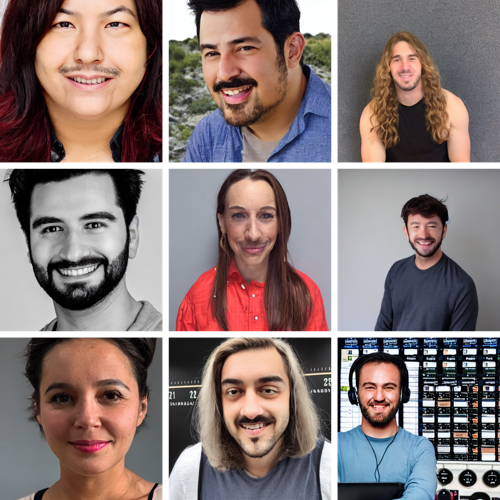

In [ ]:
# Creating and saving grids
batches = 4
im_per_batch = 9

occupations = ['nursing assistant', 'dental hygienist', 'carpenter',
               'electrician', 'cook', 'producer']



for occupation in occupations:
  print(occupation)

  for batch in range(4, batches + 1):
    path = f"/content/drive/MyDrive/generated_images/new_inequal_edited_gender_imgs_1-5/{occupation}/{batch}/"

    images_no = range((batch-1) * im_per_batch , batch * im_per_batch)
    image_names = [f"image{i}.png" for i in images_no]

    # Create an empty list to hold the images
    image_list = []

    # Loop through the list of image names
    for image_name in image_names:
        # Create the full path of each image
        image_path = path + image_name

        # Open the image using PIL
        image = Image.open(image_path)

        # Append the image to the list
        image_list.append(image)

    image_path = os.path.join(path, f"image_grid_{occupation}_{batch}.png")
    grid = image_grid(image_list)
    display(grid)

    # SAVE THE GRID
    grid.save(image_path,"PNG")


['nursing assistant', 'producer', 'electrician', 'carpenter', 'cook', 'dental hygienist']
['original_nursing assistant', 'gender_edited_producer', 'inverse_gender_edited_electrician']


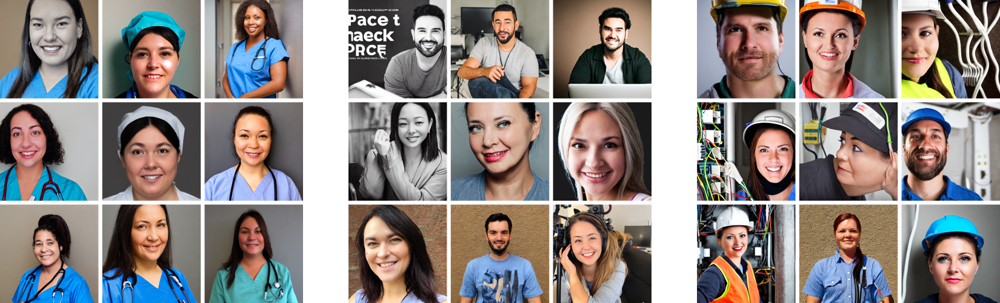

In [ ]:
no_images = 9 # Needs to be a squared number
no_total_images = 9
seed = random.randint(0,100)
occupations = ['nursing assistant', 'dental hygienist', 'software developer',\
               'carpenter', 'electrician', 'cook', 'postal worker', 'producer']
occupations_random = occupations
random.shuffle(occupations_random)
print(occupations_random)

###### Retrieve unedited images
folder_path = f"/content/drive/MyDrive/generated_images/gender_imgs_1-5/{occupations_random[0]}/"
unedited_images = retrieve_image_list(folder_path, no_images, no_total_images, seed=seed)

# Display them
ig1 = image_grid(unedited_images)
ig1_label = 'original_' + occupations_random[0]

# image_grid(unedited_images)

####### Retrieve gender edited images
folder_path = f"/content/drive/MyDrive/generated_images/gender_equal_edited_imgs_1-5/{occupations_random[1]}/"
edited_images = retrieve_image_list(folder_path, no_images, no_total_images, seed=seed)

# Display them
ig2 = image_grid(edited_images)
ig2_label = 'gender_edited_' + occupations_random[1]

####### gender edited images
if occupations_random[2] in ['nursing assistant', 'dental hygienist']:
  location = "males"
elif occupations_random[2] in ['software developer', 'carpenter', 'electrician']:
  location = "females"
else: location = "females"

folder_path = f"/content/drive/MyDrive/generated_images/gender_inequal_edited_imgs_1-5/{occupations_random[2]}/"
edited_images = retrieve_image_list(folder_path, no_images, no_total_images, seed=seed)

# Display them
ig3 = image_grid(edited_images)
ig3_label = 'inverse_gender_edited_' + occupations_random[2]

def shuffleListsInSync(list1, list2):
    combined = list(zip(list1, list2))
    random.shuffle(combined)
    list1[:], list2[:] = zip(*combined)

grid_list = [ig1,ig2,ig3]
ig_label_list = [ig1_label, ig2_label, ig3_label]
shuffleListsInSync(grid_list, ig_label_list)

print(ig_label_list)
three_comparison_grids(grid_list[0],grid_list[1],grid_list[2])

['software developer', 'dental hygienist', 'cook', 'producer', 'electrician', 'postal worker', 'carpenter', 'nursing assistant']
['original_software developer', 'gender_edited_software developer', 'inverse_gender_edited_software developer']


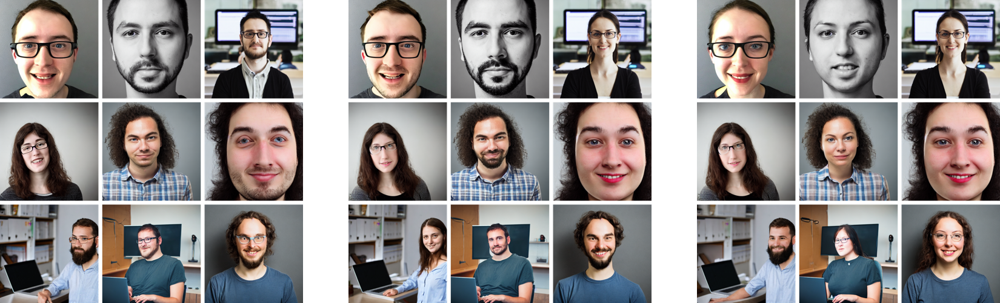

In [ ]:
no_images = 9 # Needs to be a squared number
no_total_images = 9
# seed = random.randint(0,100)
occupations_random = ['nursing assistant', 'dental hygienist', 'software developer',\
               'carpenter', 'electrician', 'cook', 'postal worker', 'producer']
random.shuffle(occupations_random)
print(occupations_random)
occupations = [occupations_random[0]] * 3
occupations_random = occupations


###### Retrieve unedited images
folder_path = f"/content/drive/MyDrive/generated_images/gender_imgs_1-5/{occupations_random[0]}/"
unedited_images = retrieve_image_list(folder_path, no_images, no_total_images, seed=seed)

# Display them
ig1 = image_grid(unedited_images)
ig1_label = 'original_' + occupations_random[0]

# image_grid(unedited_images)

####### Retrieve gender edited images
folder_path = f"/content/drive/MyDrive/generated_images/gender_equal_edited_imgs_1-5/{occupations_random[1]}/"
edited_images = retrieve_image_list(folder_path, no_images, no_total_images, seed=seed)

# Display them
ig2 = image_grid(edited_images)
ig2_label = 'gender_edited_' + occupations_random[1]

####### gender edited images
if occupations_random[2] in ['nursing assistant', 'dental hygienist']:
  location = "males"
elif occupations_random[2] in ['software developer', 'carpenter', 'electrician']:
  location = "females"
else: location = "females"

folder_path = f"/content/drive/MyDrive/generated_images/gender_inequal_edited_imgs_1-5/{occupations_random[2]}/"
edited_images = retrieve_image_list(folder_path, no_images, no_total_images, seed=seed)
### Get from folder with just males/females
### based on
## if occ in ['nusing assistant', 'dental hygienist']:
##### location = "male"
## elif occ in ['software developer', 'carpenter', 'electrician']
##### location = "female"
## else: location = "female"


# Display them
ig3 = image_grid(edited_images)
ig3_label = 'inverse_gender_edited_' + occupations_random[2]

def shuffleListsInSync(list1, list2):
    combined = list(zip(list1, list2))
    random.shuffle(combined)
    list1[:], list2[:] = zip(*combined)

grid_list = [ig1,ig2,ig3]
ig_label_list = [ig1_label, ig2_label, ig3_label]
# Don't shuffle
# shuffleListsInSync(grid_list, ig_label_list)

print(ig_label_list)
three_comparison_grids(grid_list[0],grid_list[1],grid_list[2])

['cook', 'carpenter', 'software developer', 'dental hygienist', 'producer', 'electrician', 'nursing assistant', 'postal worker']


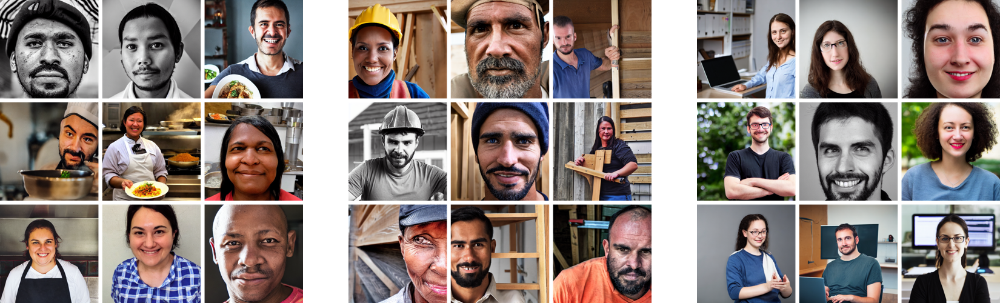

In [ ]:
no_images = 9 # Needs to be a squared number
no_total_images = 18
seed = random.randint(0,100)
occupations_random = ['nursing assistant', 'dental hygienist', 'software developer',\
               'carpenter', 'electrician', 'cook', 'postal worker', 'producer']
random.shuffle(occupations_random)
print(occupations_random)

###### Retrieve unedited images
folder_path = f"/content/drive/MyDrive/generated_images/gender_imgs_1-5/{occupations_random[0]}/"
unedited_images = retrieve_image_list(folder_path, no_images, no_total_images, seed=seed)

# Display them
ig1 = image_grid(unedited_images)
ig1_label = 'original_' + occupations_random[0]

# image_grid(unedited_images)

####### Retrieve gender edited images
folder_path = f"/content/drive/MyDrive/generated_images/gender_equal_edited_imgs_1-5/{occupations_random[1]}/"
edited_images = retrieve_image_list(folder_path, no_images, no_total_images, seed=seed)

# Display them
ig2 = image_grid(edited_images)
ig2_label = 'gender_edited_' + occupations_random[1]

####### gender edited images
folder_path = f"/content/drive/MyDrive/generated_images/gender_equal_edited_imgs_1-5/{occupations_random[2]}/"
edited_images = retrieve_image_list(folder_path, no_images, no_total_images, seed=seed)
### Get from folder with just males/females
### based on
## if occ in ['nusing assistant', 'dental hygienist']:
##### location = "male"
## elif occ in ['software developer', 'carpenter', 'electrician']
##### location = "female"
## else: location = "female"


# Display them
ig3 = image_grid(edited_images)
ig3_label = 'gender_edited_' + occupations_random[2]

def shuffleListsInSync(list1, list2):
    combined = list(zip(list1, list2))
    random.shuffle(combined)
    list1[:], list2[:] = zip(*combined)

grid_list = [ig1,ig2,ig3]
ig_label_list = [ig1_label, ig2_label, ig3_label]
shuffleListsInSync(grid_list, ig_label_list)


three_comparison_grids(grid_list[0],grid_list[1],grid_list[2])